# Notebook para generar imágenes comparando ground truth y predicciones

En este notebook vamos a cargar el modelo YOLO que hemos entrenado en Google Colab y vamos a generar imágenes que comparan las predicciones del modelo con el ground truth.

In [58]:
# Import libraries
import time
import os
import random
from tqdm import tqdm
from ultralytics import YOLO
import matplotlib.pyplot as plt
import seaborn as sns
import cv2

In [59]:
# Constantes
PATH_MODEL = '../runs/detect'
MODEL_NAME = 'gcolab_very_large_United_States_cvNO_60ex15b_pt/weights/best.pt'

PATH_MODEL = os.path.join(PATH_MODEL, MODEL_NAME)

IMAGES_PATH = '../data/rdd2022-DatasetNinja/United_States/train/fold_0'

# Label ID
LABEL = {
    0: 'D00: Longitudinal Crack',
    1: 'D10: Transverse Crack',
    2: 'D20: Aligator Crack',
    3: 'D40: Pothole',
}

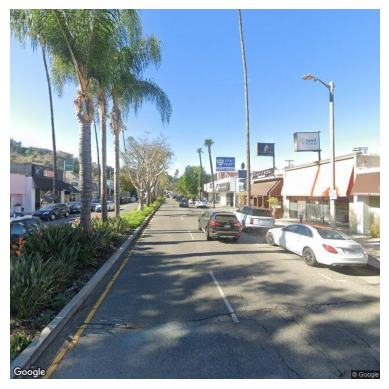

In [60]:
# Cargamos una imágen aleatoria de images y sus anotaciones de labels
random.seed(0)
random_image = random.choice(os.listdir(os.path.join(IMAGES_PATH, 'images')))
image_path = os.path.join(IMAGES_PATH, 'images', random_image)
labels_path = image_path.replace('images', 'labels').replace('.jpg', '.txt')

# Mostramos la imágen
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.axis('off')
plt.show()

In [61]:
# Cargamos el modelo
model = YOLO(PATH_MODEL)

# Realizamos la predicción
results = model(image_path)


image 1/1 /Users/javi/Desktop/tfg-informatica/notebook/../data/rdd2022-DatasetNinja/United_States/train/fold_0/images/United_States_003480.jpg: 640x640 3 D10 - Transverse Cracks, 626.1ms
Speed: 1.2ms preprocess, 626.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


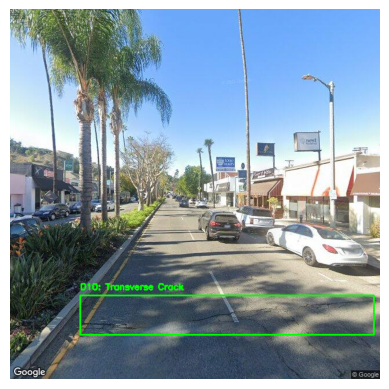

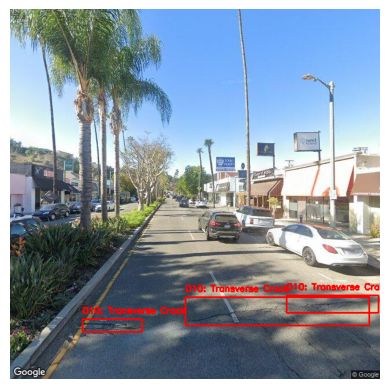

In [62]:
image_gt = image.copy()

# Imagen con el ground truth
with open(labels_path, 'r') as f:
    labels = f.readlines()
    for label in labels:
        cls, x, y, w, h = map(float, label.split())
        img_widht, img_height = image_gt.shape[1], image_gt.shape[0]
        x1 = int((x - w/2) * img_widht)
        y1 = int((y - h/2) * img_height)
        x2 = int((x + w/2) * img_widht)
        y2 = int((y + h/2) * img_height)
        cv2.rectangle(image_gt, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(image_gt, LABEL[int(cls)], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

plt.imshow(image_gt)
plt.axis('off')
plt.show()

image_pred = image.copy()

# Imagen con las predicciones
for cls, xywhn in zip(results[0].boxes.cls, results[0].boxes.xywhn):
    img_widht, img_height = image_pred.shape[1], image_pred.shape[0]
    x, y, w, h = xywhn
    x1 = int((x - w/2) * img_widht)
    y1 = int((y - h/2) * img_height)
    x2 = int((x + w/2) * img_widht)
    y2 = int((y + h/2) * img_height)
    cv2.rectangle(image_pred, (x1, y1), (x2, y2), (255, 0, 0), 2)
    cv2.putText(image_pred, LABEL[int(cls)], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

plt.imshow(image_pred)
plt.axis('off')
plt.show()

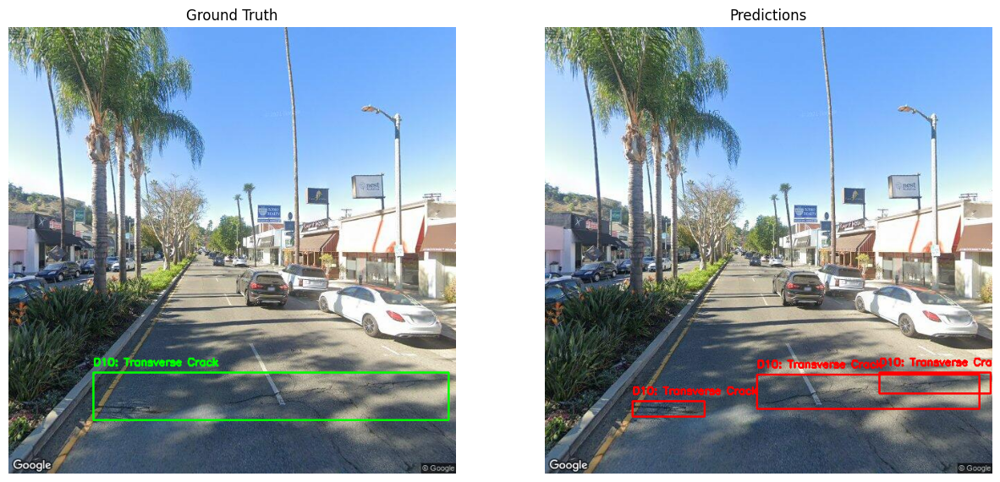

In [63]:
# Mostramos las dos imágenes juntas
fig, ax = plt.subplots(1, 2, figsize=(15, 15))
ax[0].imshow(image_gt)
ax[0].axis('off')
ax[0].set_title('Ground Truth')
ax[1].imshow(image_pred)
ax[1].axis('off')
ax[1].set_title('Predictions')
plt.show()


image 1/1 /Users/javi/Desktop/tfg-informatica/notebook/../data/rdd2022-DatasetNinja/United_States/train/fold_0/images/United_States_001360.jpg: 640x640 1 D00 - Longitudinal Crack, 1 D10 - Transverse Crack, 538.2ms
Speed: 7.8ms preprocess, 538.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


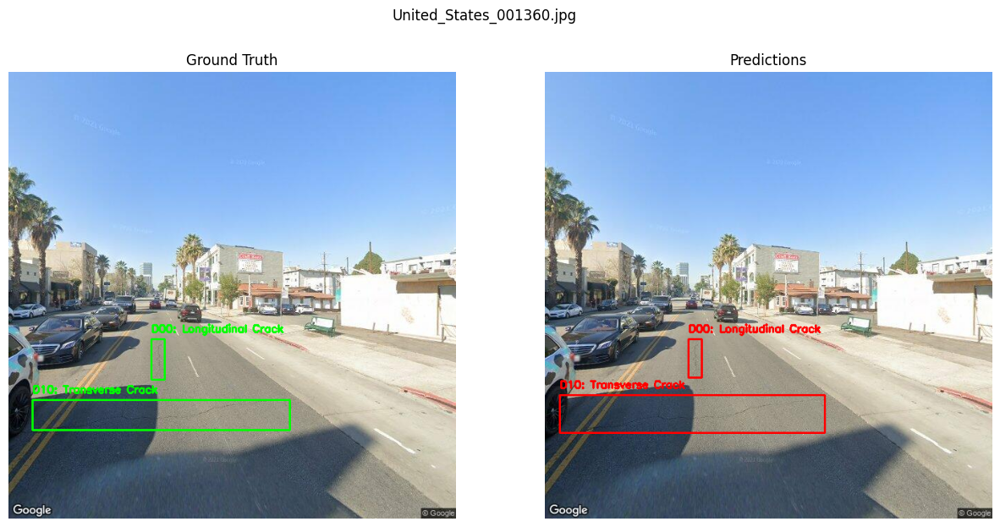


image 1/1 /Users/javi/Desktop/tfg-informatica/notebook/../data/rdd2022-DatasetNinja/United_States/train/fold_0/images/United_States_003812.jpg: 640x640 2 D00 - Longitudinal Cracks, 1 D10 - Transverse Crack, 480.8ms
Speed: 1.6ms preprocess, 480.8ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


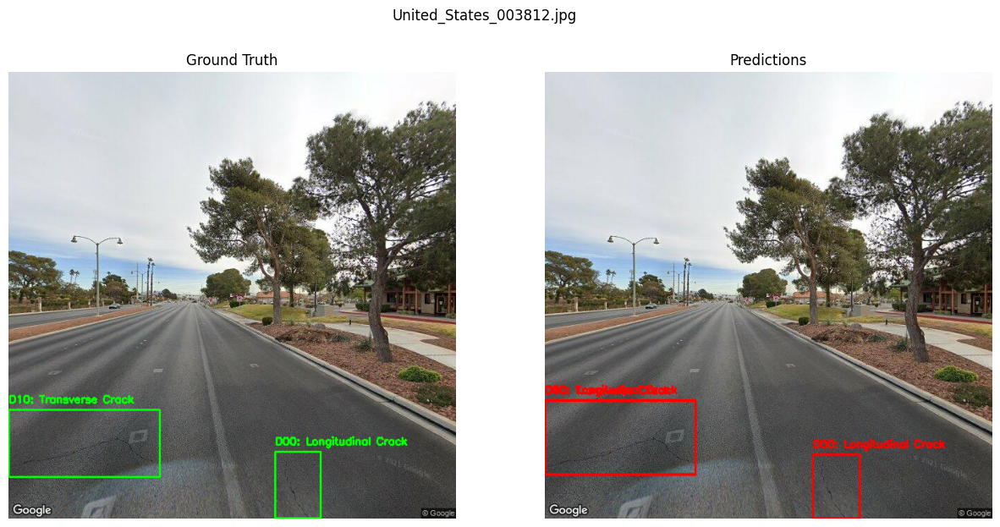


image 1/1 /Users/javi/Desktop/tfg-informatica/notebook/../data/rdd2022-DatasetNinja/United_States/train/fold_0/images/United_States_000642.jpg: 640x640 1 D00 - Longitudinal Crack, 1 D10 - Transverse Crack, 498.7ms
Speed: 1.3ms preprocess, 498.7ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


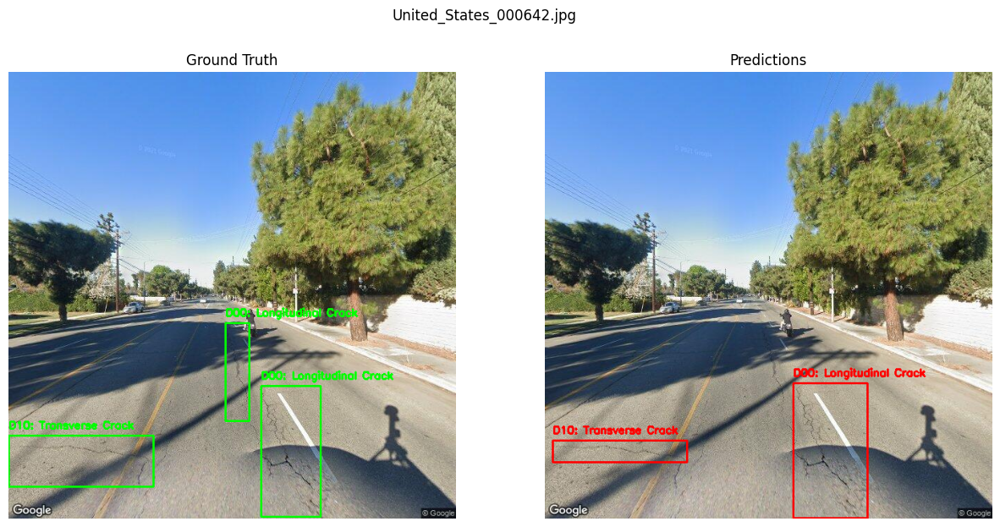


image 1/1 /Users/javi/Desktop/tfg-informatica/notebook/../data/rdd2022-DatasetNinja/United_States/train/fold_0/images/United_States_004734.jpg: 640x640 4 D00 - Longitudinal Cracks, 1 D10 - Transverse Crack, 500.0ms
Speed: 1.0ms preprocess, 500.0ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


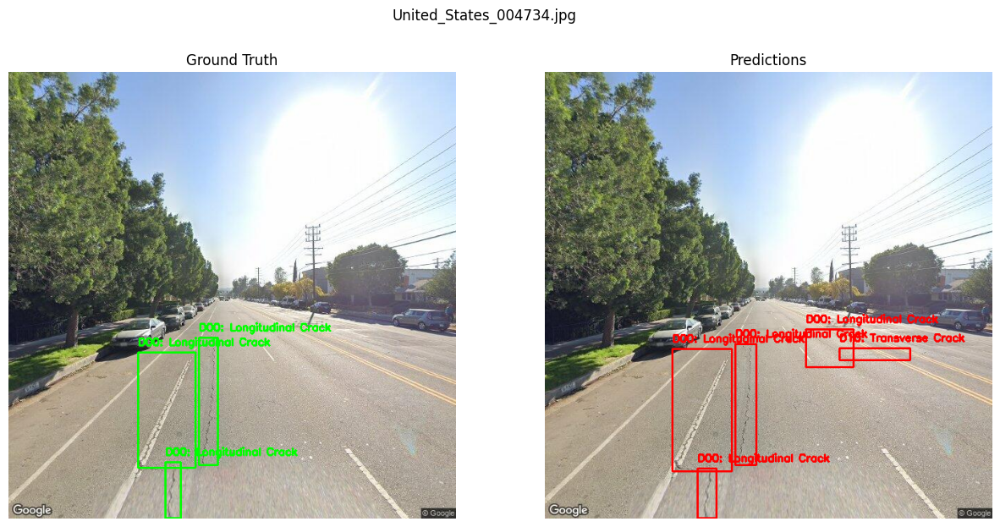


image 1/1 /Users/javi/Desktop/tfg-informatica/notebook/../data/rdd2022-DatasetNinja/United_States/train/fold_0/images/United_States_000692.jpg: 640x640 2 D00 - Longitudinal Cracks, 627.0ms
Speed: 1.3ms preprocess, 627.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


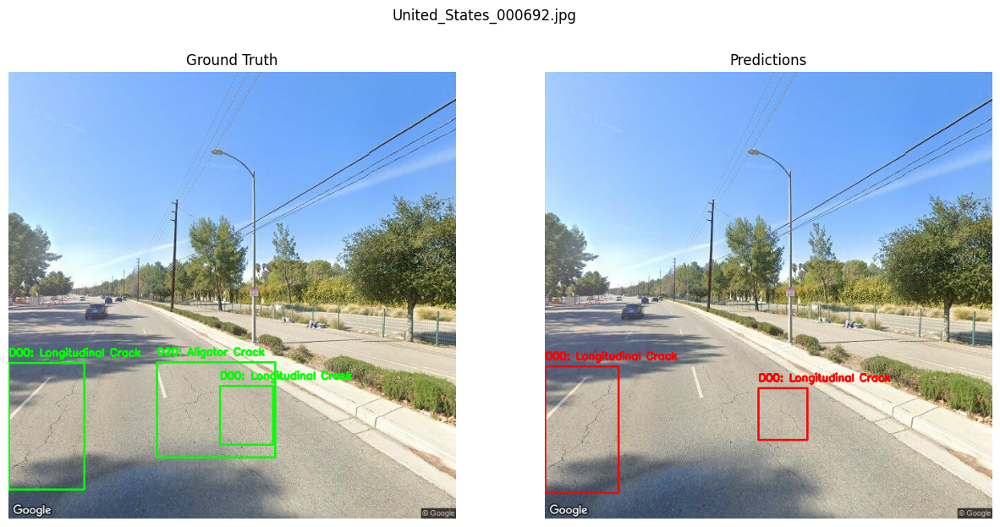


image 1/1 /Users/javi/Desktop/tfg-informatica/notebook/../data/rdd2022-DatasetNinja/United_States/train/fold_0/images/United_States_004160.jpg: 640x640 1 D00 - Longitudinal Crack, 499.1ms
Speed: 1.4ms preprocess, 499.1ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


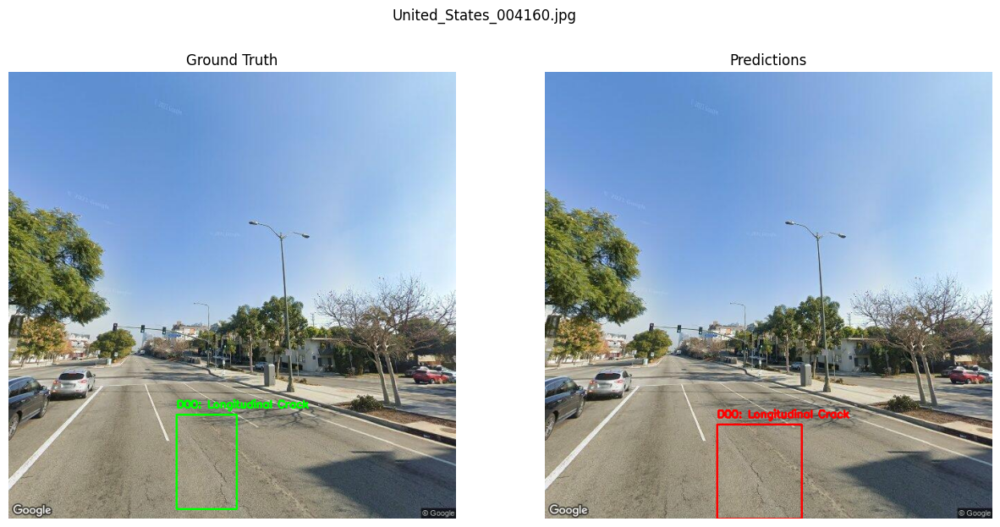


image 1/1 /Users/javi/Desktop/tfg-informatica/notebook/../data/rdd2022-DatasetNinja/United_States/train/fold_0/images/United_States_004598.jpg: 640x640 1 D00 - Longitudinal Crack, 527.7ms
Speed: 1.4ms preprocess, 527.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


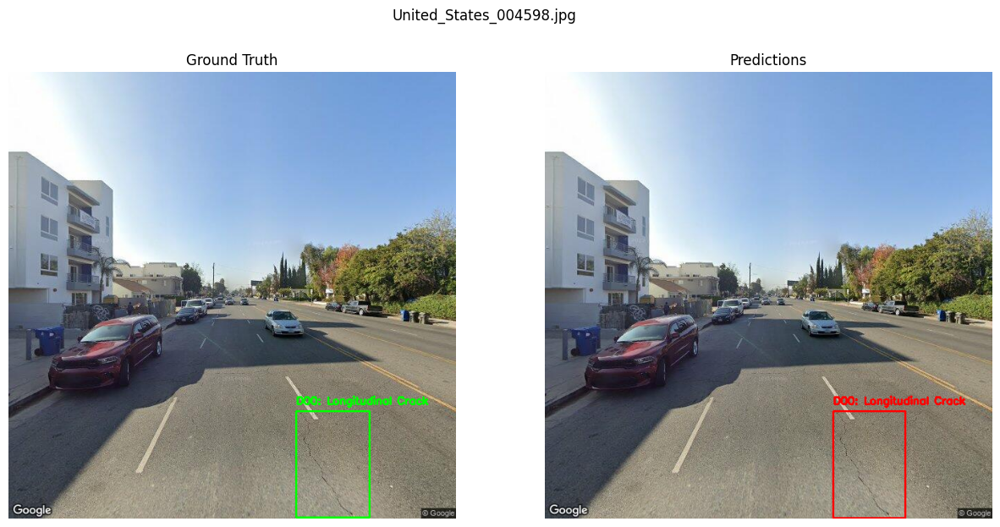


image 1/1 /Users/javi/Desktop/tfg-informatica/notebook/../data/rdd2022-DatasetNinja/United_States/train/fold_0/images/United_States_003989.jpg: 640x640 1 D10 - Transverse Crack, 560.4ms
Speed: 3.9ms preprocess, 560.4ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


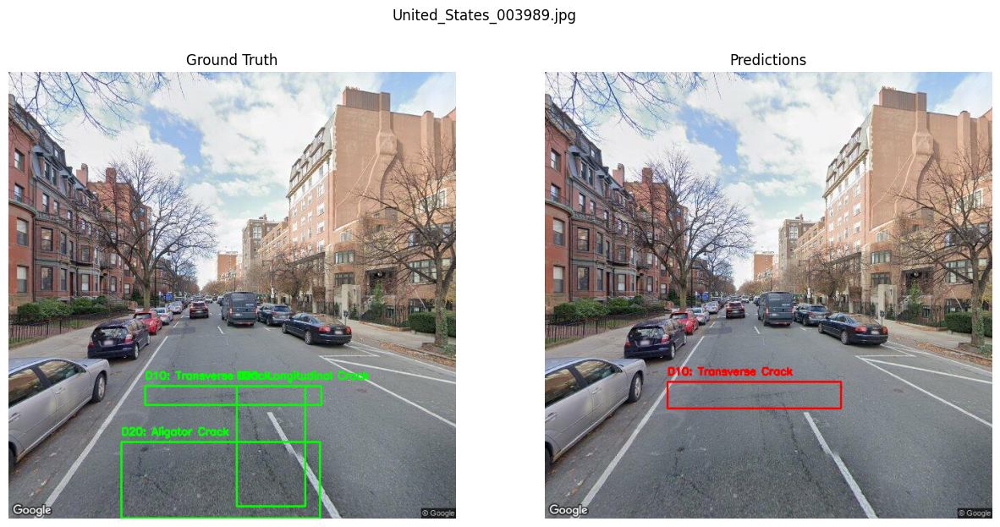


image 1/1 /Users/javi/Desktop/tfg-informatica/notebook/../data/rdd2022-DatasetNinja/United_States/train/fold_0/images/United_States_004516.jpg: 640x640 3 D00 - Longitudinal Cracks, 1 D10 - Transverse Crack, 488.5ms
Speed: 1.8ms preprocess, 488.5ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


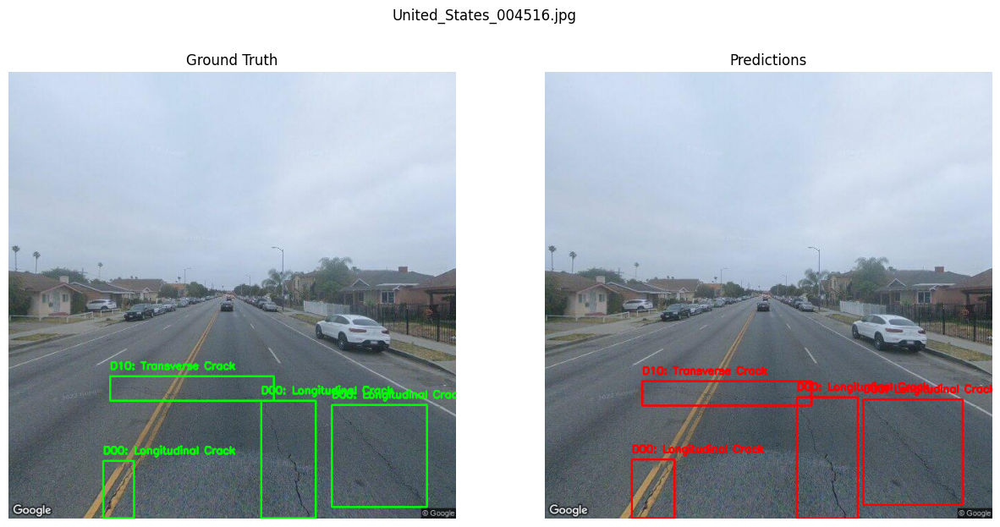


image 1/1 /Users/javi/Desktop/tfg-informatica/notebook/../data/rdd2022-DatasetNinja/United_States/train/fold_0/images/United_States_003472.jpg: 640x640 3 D00 - Longitudinal Cracks, 2 D10 - Transverse Cracks, 549.4ms
Speed: 1.6ms preprocess, 549.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


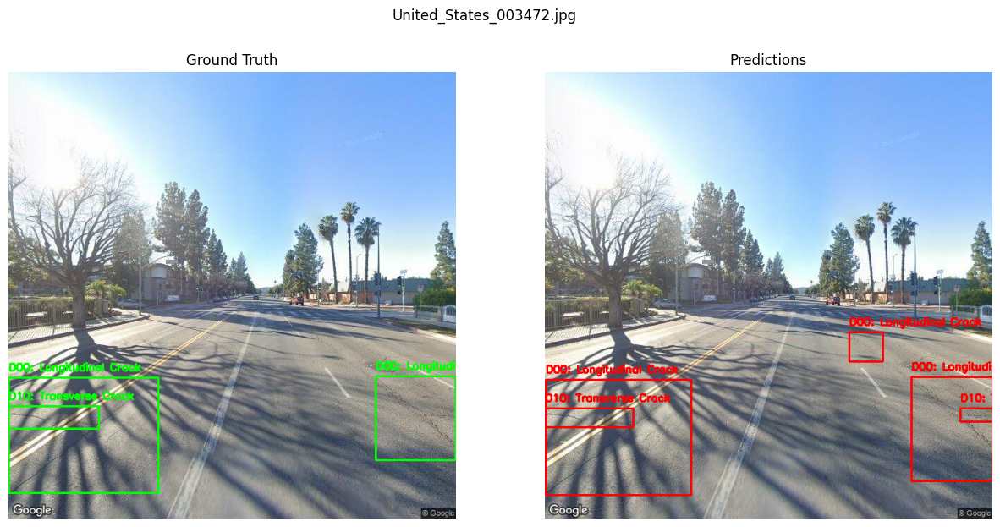


image 1/1 /Users/javi/Desktop/tfg-informatica/notebook/../data/rdd2022-DatasetNinja/United_States/train/fold_0/images/United_States_002736.jpg: 640x640 2 D00 - Longitudinal Cracks, 4 D10 - Transverse Cracks, 1 D40 - Pothole, 467.8ms
Speed: 0.9ms preprocess, 467.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


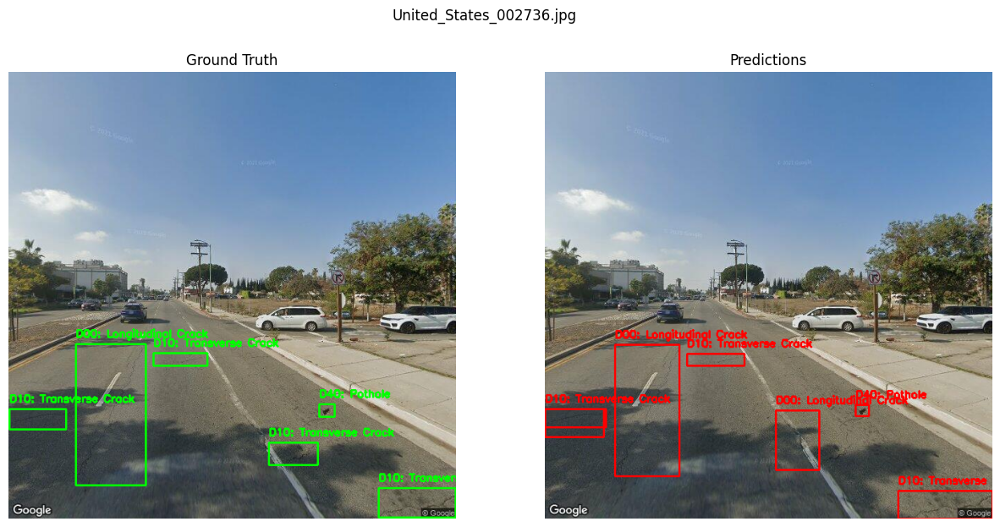


image 1/1 /Users/javi/Desktop/tfg-informatica/notebook/../data/rdd2022-DatasetNinja/United_States/train/fold_0/images/United_States_002707.jpg: 640x640 1 D00 - Longitudinal Crack, 1 D20 - Alligator Crack, 574.5ms
Speed: 1.2ms preprocess, 574.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


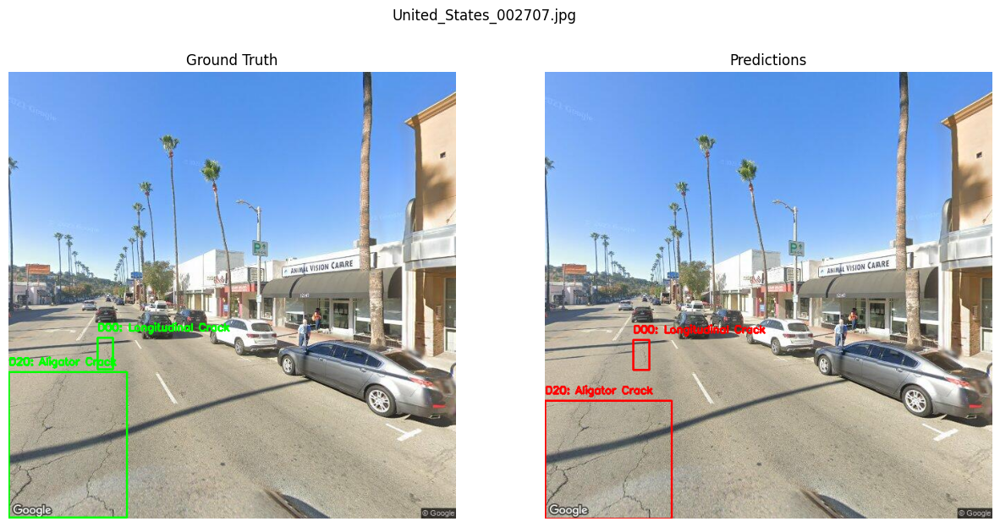


image 1/1 /Users/javi/Desktop/tfg-informatica/notebook/../data/rdd2022-DatasetNinja/United_States/train/fold_0/images/United_States_002650.jpg: 640x640 1 D20 - Alligator Crack, 629.1ms
Speed: 2.2ms preprocess, 629.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


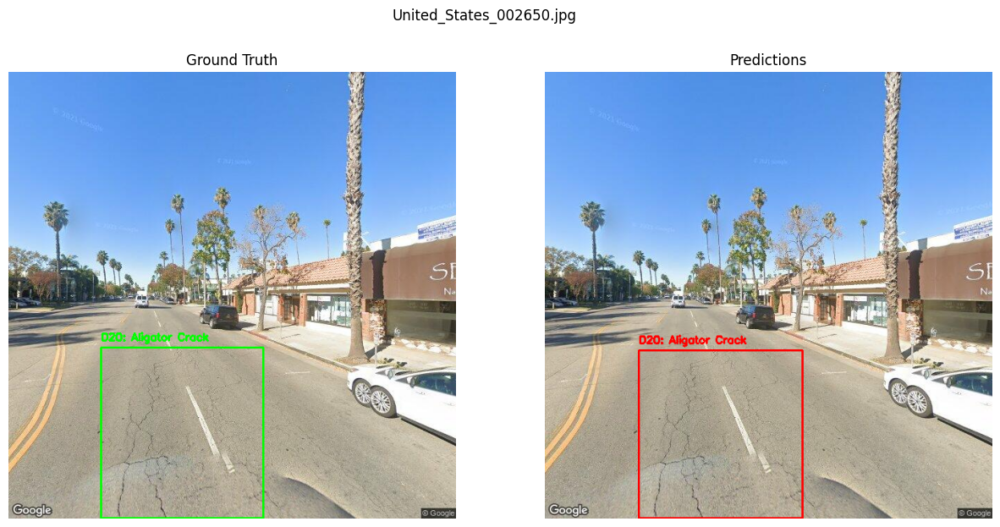


image 1/1 /Users/javi/Desktop/tfg-informatica/notebook/../data/rdd2022-DatasetNinja/United_States/train/fold_0/images/United_States_003683.jpg: 640x640 2 D00 - Longitudinal Cracks, 1 D10 - Transverse Crack, 1 D20 - Alligator Crack, 513.4ms
Speed: 1.9ms preprocess, 513.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


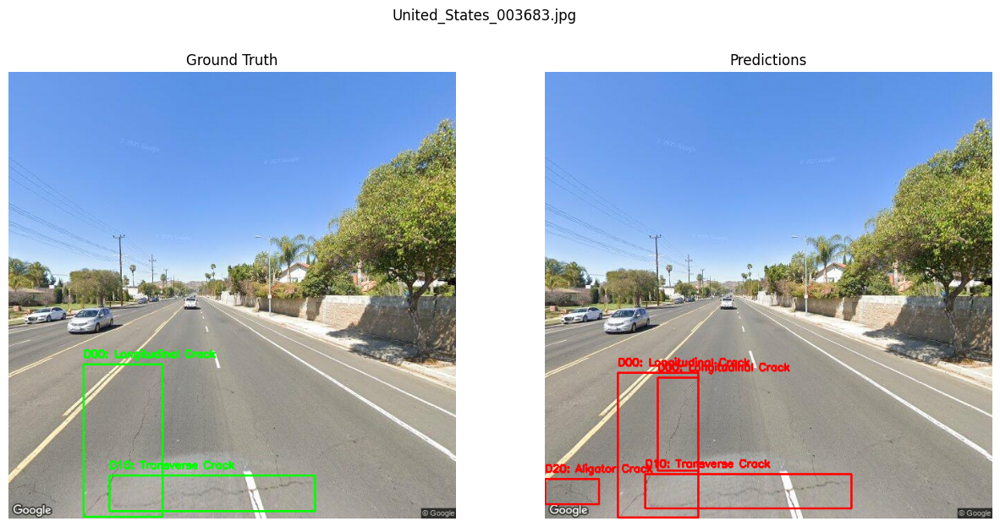


image 1/1 /Users/javi/Desktop/tfg-informatica/notebook/../data/rdd2022-DatasetNinja/United_States/train/fold_0/images/United_States_000969.jpg: 640x640 2 D00 - Longitudinal Cracks, 4 D10 - Transverse Cracks, 543.0ms
Speed: 1.3ms preprocess, 543.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


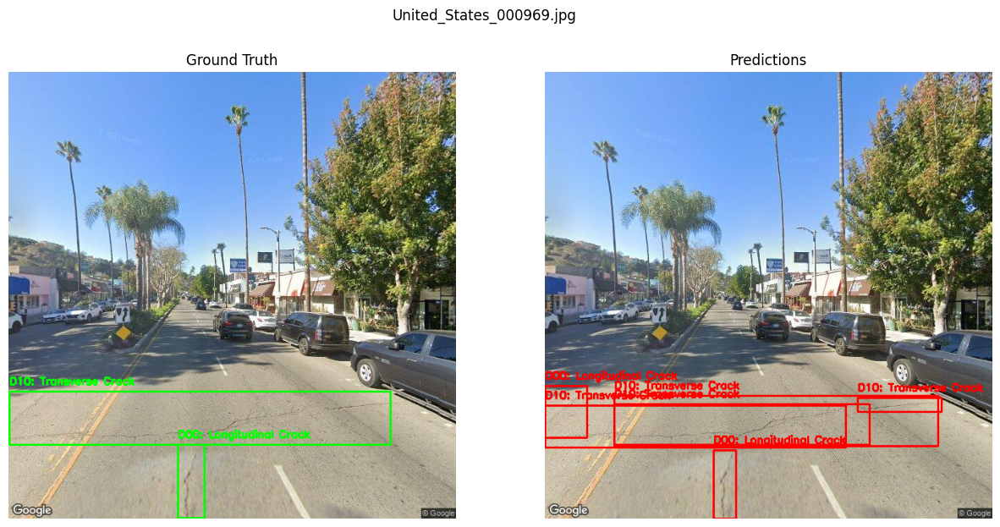


image 1/1 /Users/javi/Desktop/tfg-informatica/notebook/../data/rdd2022-DatasetNinja/United_States/train/fold_0/images/United_States_002447.jpg: 640x640 6 D00 - Longitudinal Cracks, 1 D10 - Transverse Crack, 505.6ms
Speed: 1.6ms preprocess, 505.6ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


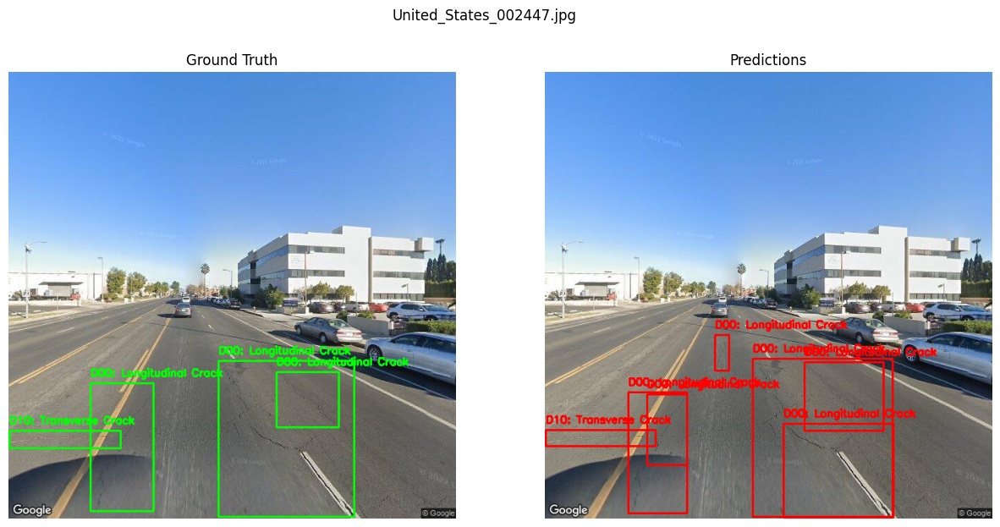


image 1/1 /Users/javi/Desktop/tfg-informatica/notebook/../data/rdd2022-DatasetNinja/United_States/train/fold_0/images/United_States_003552.jpg: 640x640 2 D00 - Longitudinal Cracks, 1 D10 - Transverse Crack, 527.5ms
Speed: 1.7ms preprocess, 527.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


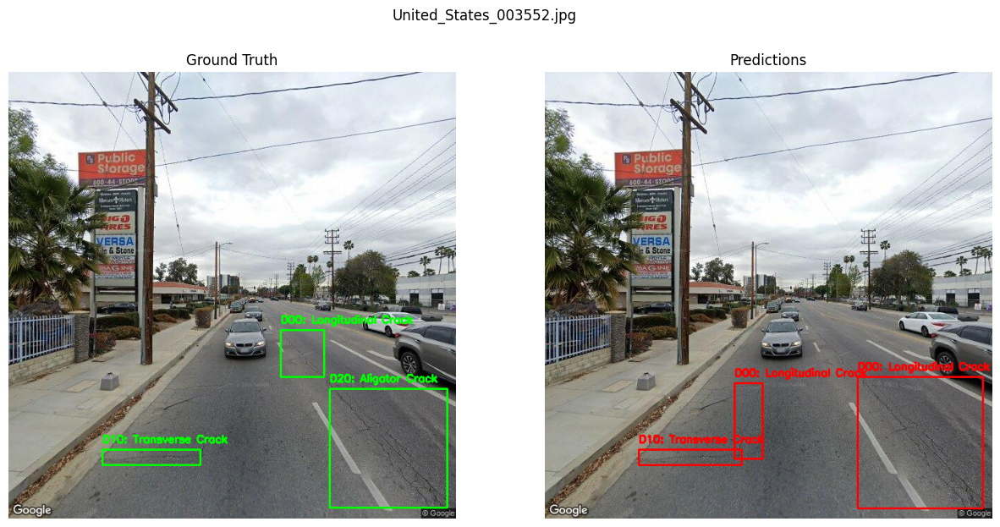


image 1/1 /Users/javi/Desktop/tfg-informatica/notebook/../data/rdd2022-DatasetNinja/United_States/train/fold_0/images/United_States_000168.jpg: 640x640 4 D00 - Longitudinal Cracks, 3 D10 - Transverse Cracks, 1416.3ms
Speed: 1.3ms preprocess, 1416.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


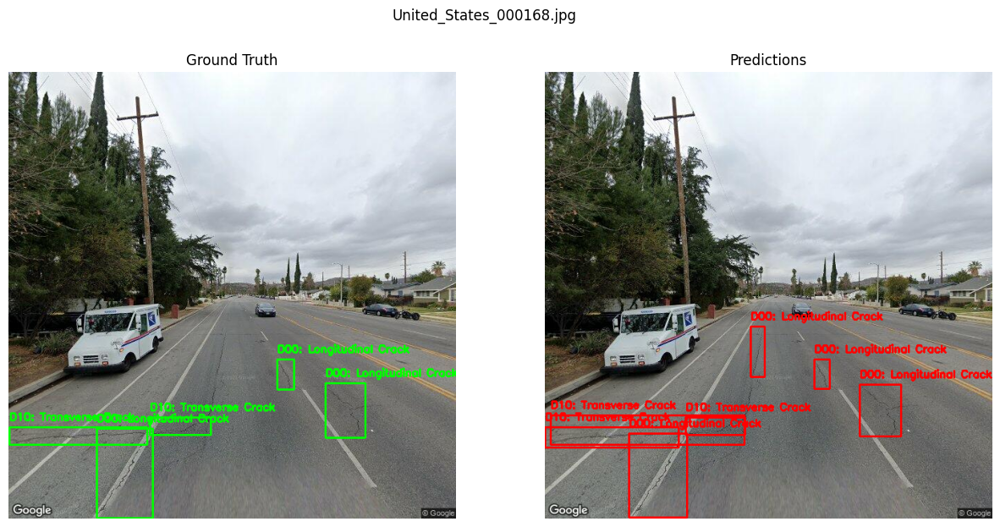


image 1/1 /Users/javi/Desktop/tfg-informatica/notebook/../data/rdd2022-DatasetNinja/United_States/train/fold_0/images/United_States_000989.jpg: 640x640 1 D10 - Transverse Crack, 524.8ms
Speed: 1.5ms preprocess, 524.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


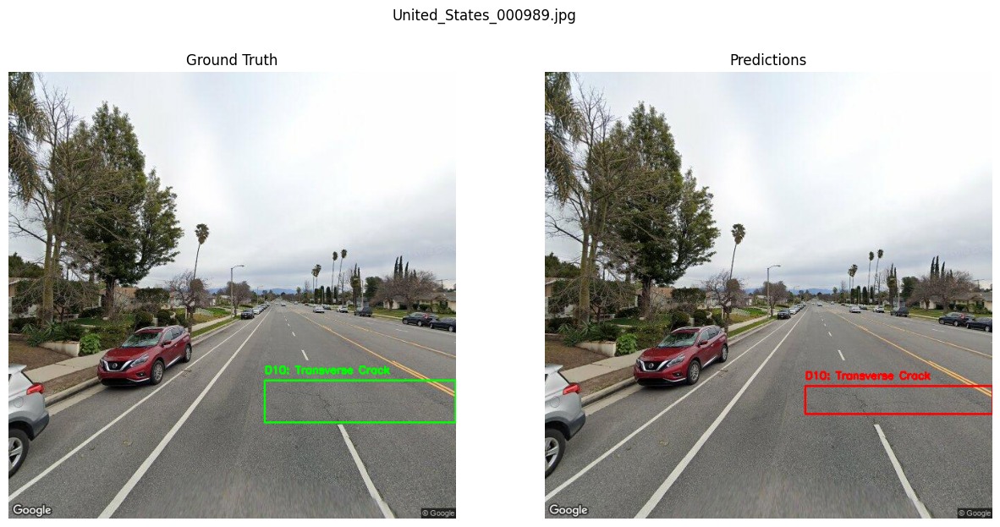


image 1/1 /Users/javi/Desktop/tfg-informatica/notebook/../data/rdd2022-DatasetNinja/United_States/train/fold_0/images/United_States_004019.jpg: 640x640 4 D00 - Longitudinal Cracks, 2 D10 - Transverse Cracks, 555.6ms
Speed: 1.1ms preprocess, 555.6ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


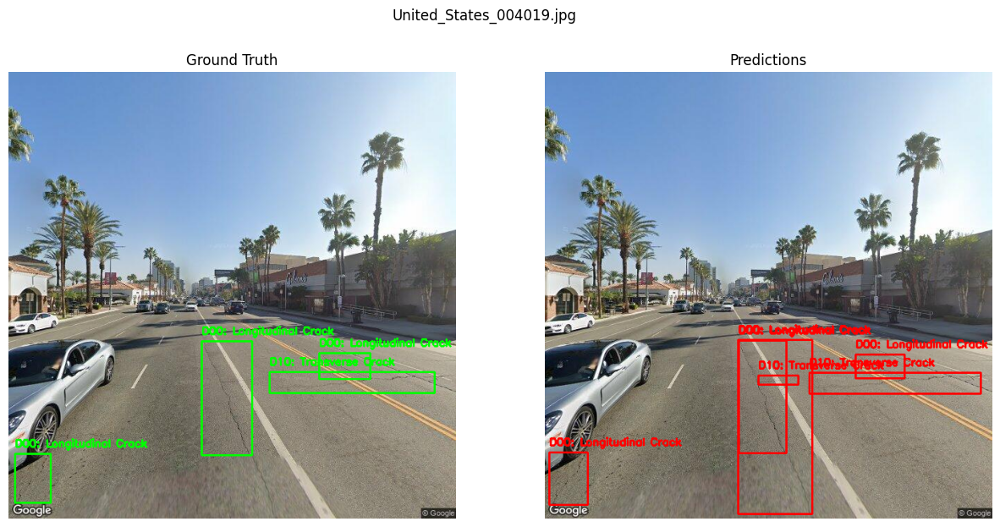


image 1/1 /Users/javi/Desktop/tfg-informatica/notebook/../data/rdd2022-DatasetNinja/United_States/train/fold_0/images/United_States_002202.jpg: 640x640 4 D00 - Longitudinal Cracks, 1 D10 - Transverse Crack, 591.8ms
Speed: 1.2ms preprocess, 591.8ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


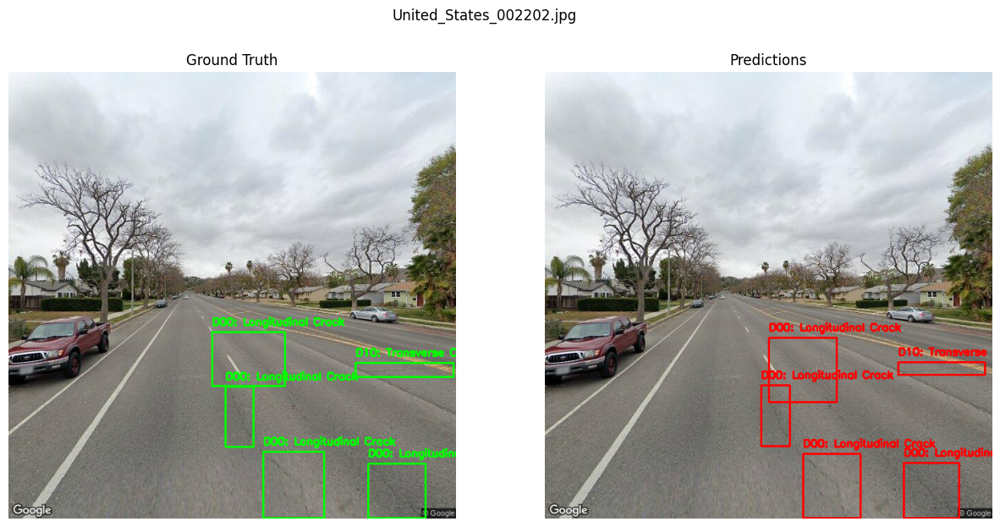


image 1/1 /Users/javi/Desktop/tfg-informatica/notebook/../data/rdd2022-DatasetNinja/United_States/train/fold_0/images/United_States_002122.jpg: 640x640 1 D00 - Longitudinal Crack, 1 D10 - Transverse Crack, 548.8ms
Speed: 2.0ms preprocess, 548.8ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


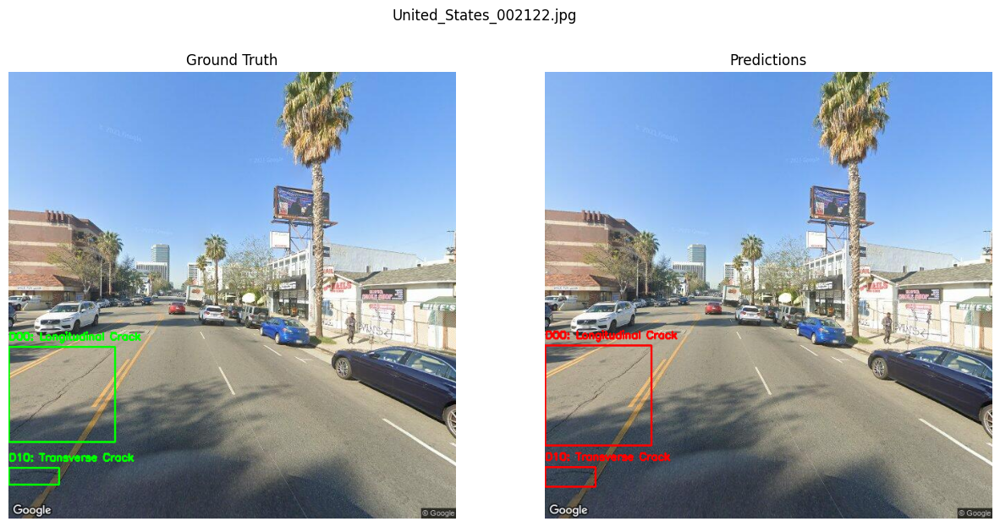


image 1/1 /Users/javi/Desktop/tfg-informatica/notebook/../data/rdd2022-DatasetNinja/United_States/train/fold_0/images/United_States_002254.jpg: 640x640 4 D10 - Transverse Cracks, 583.1ms
Speed: 3.0ms preprocess, 583.1ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


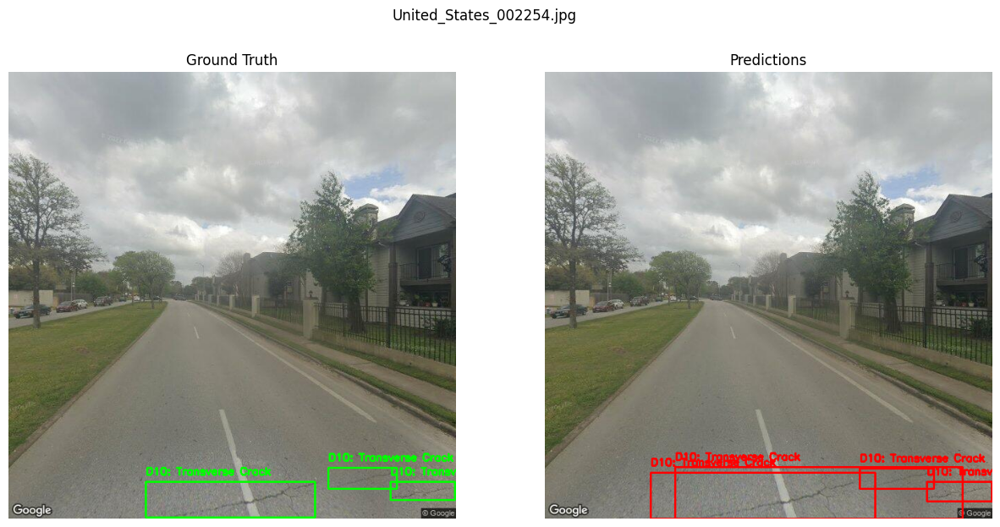


image 1/1 /Users/javi/Desktop/tfg-informatica/notebook/../data/rdd2022-DatasetNinja/United_States/train/fold_0/images/United_States_000127.jpg: 640x640 3 D10 - Transverse Cracks, 751.2ms
Speed: 1.2ms preprocess, 751.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


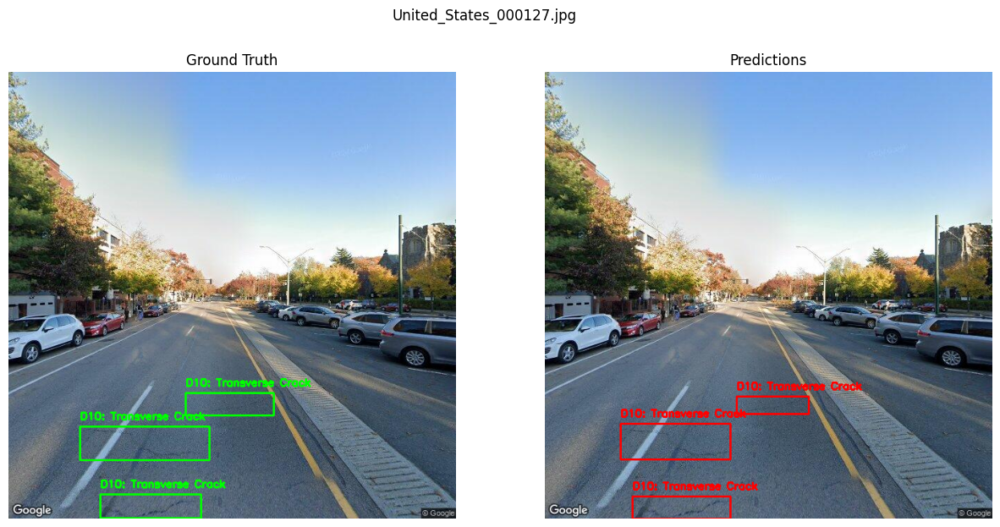


image 1/1 /Users/javi/Desktop/tfg-informatica/notebook/../data/rdd2022-DatasetNinja/United_States/train/fold_0/images/United_States_002850.jpg: 640x640 1 D00 - Longitudinal Crack, 658.1ms
Speed: 1.4ms preprocess, 658.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


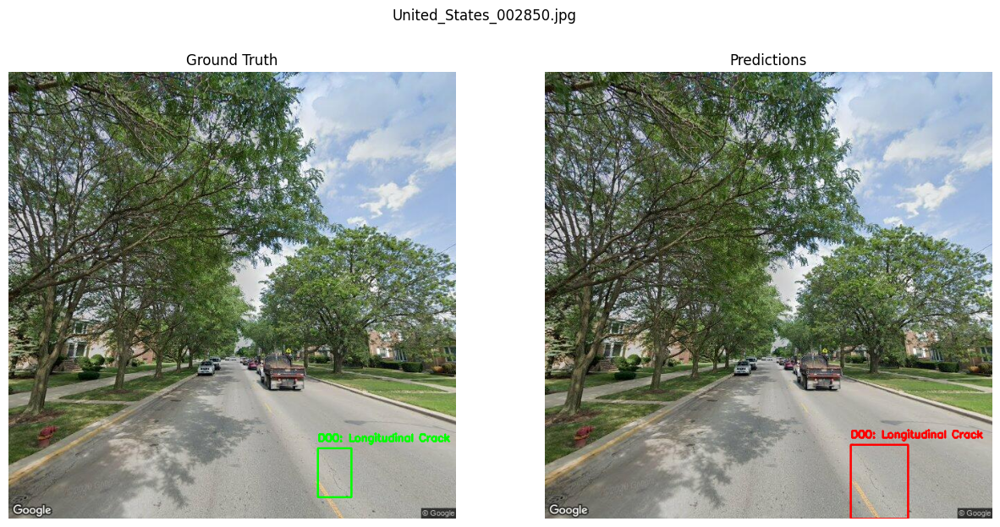

In [64]:
# Realizamos este proceso con 10 imágenes aleatorias
random.seed(1)
random_images = random.sample(os.listdir(os.path.join(IMAGES_PATH, 'images')), 25)

for random_image in random_images:
    image_path = os.path.join(IMAGES_PATH, 'images', random_image)
    labels_path = image_path.replace('images', 'labels').replace('.jpg', '.txt')

    # Realizamos la predicción
    results = model(image_path)

    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image_gt = image.copy()

    # Imagen con el ground truth
    with open(labels_path, 'r') as f:
        labels = f.readlines()
        for label in labels:
            cls, x, y, w, h = map(float, label.split())
            img_widht, img_height = image_gt.shape[1], image_gt.shape[0]
            x1 = int((x - w/2) * img_widht)
            y1 = int((y - h/2) * img_height)
            x2 = int((x + w/2) * img_widht)
            y2 = int((y + h/2) * img_height)
            cv2.rectangle(image_gt, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(image_gt, LABEL[int(cls)], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    image_pred = image.copy()

    # Imagen con las predicciones
    for cls, xywhn in zip(results[0].boxes.cls, results[0].boxes.xywhn):
        img_widht, img_height = image_pred.shape[1], image_pred.shape[0]
        x, y, w, h = xywhn
        x1 = int((x - w/2) * img_widht)
        y1 = int((y - h/2) * img_height)
        x2 = int((x + w/2) * img_widht)
        y2 = int((y + h/2) * img_height)
        cv2.rectangle(image_pred, (x1, y1), (x2, y2), (255, 0, 0), 2)
        cv2.putText(image_pred, LABEL[int(cls)], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

    # Mostramos las dos imágenes juntas
    fig, ax = plt.subplots(1, 2, figsize=(15, 7))
    ax[0].imshow(image_gt)
    ax[0].axis('off')
    ax[0].set_title('Ground Truth')
    ax[1].imshow(image_pred)
    ax[1].axis('off')
    ax[1].set_title('Predictions')
    # Ponemos el titulo de plot como el nombre de la imágen
    fig.suptitle(random_image)
    plt.show()